# Tutorial 3: Xenium Prime 5K: Mouse Brain

 <div style="margin:0; line-height:1.2">

 Analyze mouse brain spatial transcriptomics data with SpacGPA.<br/>



 Data source: https://www.10xgenomics.com/datasets/xenium-prime-fresh-frozen-mouse-brain  <br/>



 This is a mouse brain sample generated with Xenium Prime 5K.<br/>

 <div>

In [1]:
# Import SpacGPA and other required packages.
import SpacGPA as sg
import scanpy as sc
import matplotlib.pyplot as plt
import pandas as pd
import os


In [2]:
# Set the working directory to your local path.
workdir = '..'
os.chdir(workdir)


### Part 1: Gene program analysis via SpacGPA ###

In [3]:
# Load spatial transcriptomics data.
# Read the count matrix from the 10x Genomics Cell Ranger output.
adata = sc.read_10x_h5('data/Xenium_5k/Mouse_Brain_5K/cell_feature_matrix.h5')
adata.var_names_make_unique()
adata.var_names = adata.var['gene_ids']
# Read the cell metadata (including spatial coordinates) from the provided CSV file.
meta = pd.read_csv('data/Xenium_5k/Mouse_Brain_5K/cells.csv.gz')
meta.index = meta['cell_id'].astype(str)
meta = meta.reindex(adata.obs_names)
adata.obs = adata.obs.join(meta, how='left')
# Set the spatial coordinates.
adata.obsm['spatial'] = adata.obs[['y_centroid','x_centroid']].values*[-1,-1]
print(adata)


AnnData object with n_obs × n_vars = 63173 × 5006
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method'
    var: 'gene_ids', 'feature_types', 'genome'
    obsm: 'spatial'


In [4]:
# Preprocessing: log1p-transform.
sc.pp.log1p(adata)
sc.pp.filter_cells(adata, min_genes=100)
sc.pp.filter_genes(adata, min_cells = 10)
print(adata.X.shape)


(62207, 5002)


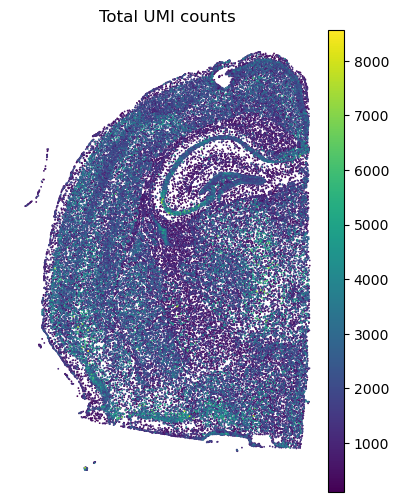

In [5]:
# Visualize the total UMI counts per spot.
plt.rcParams["figure.figsize"] = (4.5, 6)
sc.pl.spatial(adata, spot_size = 30, color = 'total_counts', frameon = False, title = 'Total UMI counts')


In [6]:
# Construct the co-expression network using SpacGPA (Gaussian graphical model).
ggm = sg.create_ggm(adata, project_name = "Mouse Brain")


Please Normalize The Expression Matrix Before Running!
Loading Data.

Running all calculations on GPU (if available).
Using single precision (float32) for all calculations.
Using chunk size of 5000 for efficient computation

Computing the number of cells co-expressing each gene pair...
Computing covariance matrix...
Computing Pearson correlation matrix...

Calculating partial correlations in 2498 iterations.
Number of genes randomly selected in each iteration: 1001
Iteration: 2498/2498, Avg loop time: 0.0126 s, Elapsed time: 0.56 min, Estimated time left: 0.00 min.                  
All iterations completed.

Performing FDR control...
Randomly redistribute the expression distribution of input genes...

Calculate correlation between genes after redistribution...

Computing the number of cells co-expressing each gene pair...
Computing covariance matrix...
Computing Pearson correlation matrix...

Calculating partial correlations in 2498 iterations.
Number of genes randomly selected in eac

In [7]:
# Show statistically significant co-expression gene pairs.
print(ggm.SigEdges.head(5))


                GeneA               GeneB      Pcor  SamplingTime         r  \
0  ENSMUSG00000029802  ENSMUSG00000040584  0.096567            90  0.578254   
1  ENSMUSG00000029802  ENSMUSG00000030834  0.031893            89  0.231888   
2  ENSMUSG00000020681  ENSMUSG00000028125  0.042191           118  0.442514   
3  ENSMUSG00000015405  ENSMUSG00000030249  0.095438           100  0.511198   
4  ENSMUSG00000044337  ENSMUSG00000015405  0.029435           108  0.242722   

   Cell_num_A  Cell_num_B  Cell_num_coexpressed      Project  
0        7142        7338                  3822  Mouse Brain  
1        7142         925                   573  Mouse Brain  
2        2258        1164                   360  Mouse Brain  
3        1131        1067                   507  Mouse Brain  
4        4151        1131                   462  Mouse Brain  


In [8]:
# Identify gene programs using the MCL-Hub algorithm (set inflation to 2).
ggm.find_modules(method = 'mcl-hub', inflation = 2, convert_to_symbols = True, species = 'mouse')
# the parameter 'convert_to_symbols' provides gene symbols in the output programs for better interpretability.



Find modules using MCL-Hub...
Current Pcor: 0.02
Total significantly co-expressed gene pairs: 39055
Iteration: 29, Max change: 0.00000000 
Converged at iteration 29.

0 modules were removed due to their linear or radial topology structure out of 70 modules.

Converting Ensembl IDs to gene symbols...


In [9]:
# Inspect the top 5 identified gene programs.
print(ggm.modules_summary.head(5))


  module_id  size  num_genes_degree_ge_2  \
0        M1   140                    130   
1        M2   131                    120   
2        M3   118                    103   
3        M4   109                     98   
4        M5   100                     94   

                                         all_symbols  \
0  P2ry13, Il10ra, Cx3cr1, Selplg, Vsir, Csf3r, T...   
1  Slc7a10, Lfng, Agt, Gjb6, S1pr1, Slc6a11, Fgfr...   
2  Slc47a1, Thbs1, Foxc2, Cdh1, Eya2, Col6a2, Bnc...   
3  Spink8, Fibcd1, Neurod6, Scn3b, Iqgap2, Gria1,...   
4  Flt1, Abcb1a, Pltp, Esam, Adgrf5, Sox18, Eng, ...   

                                           all_genes  
0  ENSMUSG00000036362, ENSMUSG00000032089, ENSMUS...  
1  ENSMUSG00000030495, ENSMUSG00000029570, ENSMUS...  
2  ENSMUSG00000010122, ENSMUSG00000040152, ENSMUS...  
3  ENSMUSG00000050074, ENSMUSG00000026841, ENSMUS...  
4  ENSMUSG00000029648, ENSMUSG00000040584, ENSMUS...  


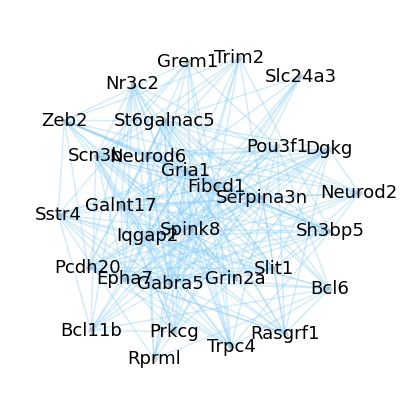

In [10]:
# Visualize the subnetwork of program M4 (top 30 genes by degree/connectivity for readability).
ggm.module_network_plot(module_id = 'M4', seed = 2, layout_iterations = 60) 
# Fix layout randomness for reproducibility via set seed.


In [11]:
# Gene Ontology (GO) enrichment analysis with BH FDR control and p-value threshold 0.05.
ggm.go_enrichment_analysis(species = 'mouse', padjust_method = "BH", pvalue_cutoff = 0.05)



Reading GO term information for |mouse|...

Start GO enrichment analysis ...
Found 0 significant enriched GO terms in M70         
GO enrichment analysis completed. Found 4538 significant enriched GO terms total.


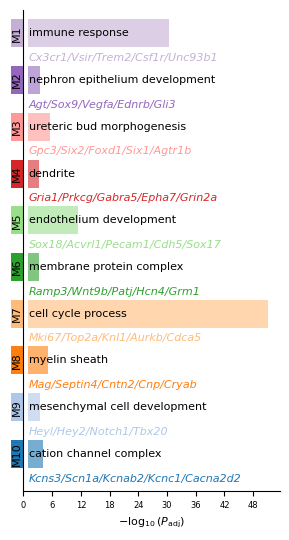

In [12]:
# Visualize top enriched GO terms for top 20 identified programs.
program_list = ggm.modules_summary['module_id'].tolist()
ggm.module_go_enrichment_plot(shown_modules = program_list[:10], go_per_module = 1)


In [13]:
# Mammalian Phenotype (MP) Ontology enrichment analysis with BH FDR control and p-value threshold 0.05.
ggm.mp_enrichment_analysis(species = 'mouse', padjust_method = "BH", pvalue_cutoff = 0.05)



Reading MP term information for |mouse|...

Start MP enrichment analysis ...
Found 0 significant enriched MP terms in M70         
MP enrichment analysis completed. Found 2609 significant enriched MP terms total.


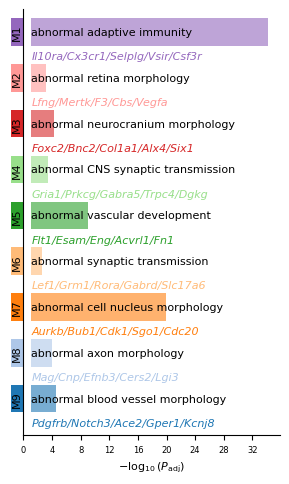

In [14]:
# Visualize top enriched MP terms for top 20 identified programs.
ggm.module_mp_enrichment_plot(shown_modules = program_list[:10], mp_per_module = 1)


    module_id  module_size  go_rank       go_id         go_category  \
970        M4          109        1  GO:0030425  cellular_component   
971        M4          109        2  GO:0097447  cellular_component   
972        M4          109        3  GO:0098794  cellular_component   

            go_term  
970        dendrite  
971  dendritic tree  
972     postsynapse  


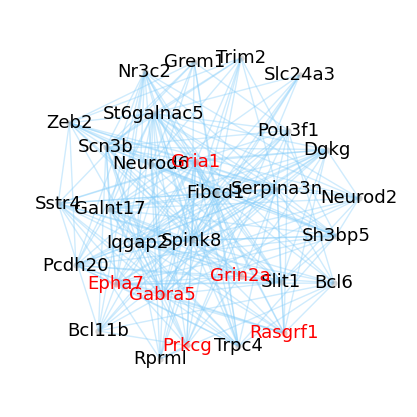

    module_id  module_size  mp_rank       mp_id  \
730        M4          109        1  MP:0002206   
731        M4          109        2  MP:0003635   
732        M4          109        3  MP:0021009   

                                mp_term  
730  abnormal CNS synaptic transmission  
731      abnormal synaptic transmission  
732        abnormal synaptic physiology  


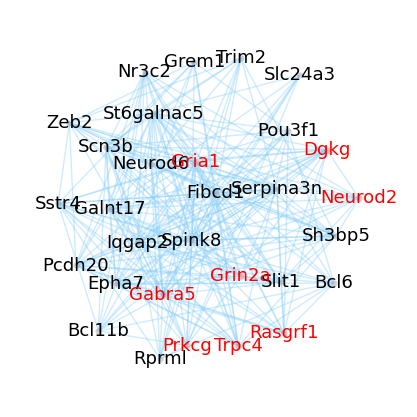

In [15]:
# Visualize the M4 network with nodes highlighted by a selected GO or MP term.
M4_GO_Enrich = ggm.go_enrichment[ggm.go_enrichment['module_id'] == 'M4']
print(M4_GO_Enrich.iloc[:3, :6])
ggm.module_network_plot(module_id = 'M4', highlight_anno = "dendrite", seed = 2, layout_iterations = 55)
M4_MP_Enrich = ggm.mp_enrichment[ggm.mp_enrichment['module_id'] == 'M4']
print(M4_MP_Enrich.iloc[:3, :5])
ggm.module_network_plot(module_id = 'M4', highlight_anno = "abnormal CNS synaptic transmission", seed = 2, layout_iterations = 55)


In [16]:
# Print a summary of the GGM analysis.
print(ggm)


View of ggm object: Mouse Brain
MetaInfo:
  Gene Number: 5002
  Sample Number: 62207
  Pcor Threshold: 0.02

Results:
  SigEdges: DataFrame with 39055 significant gene pairs
  modules: 70 modules with 2825 genes
  modules_summary: DataFrame with 70 rows
  FDR: Exists



In [17]:
# Save the GGM object to HDF5 for later reuse.
sg.save_ggm(ggm, "data/Mouse_Brain_5K.ggm.h5")


### Part 2: Spot annotation based on program expression ###

In [18]:
# Compute per-spot expression scores of each gene program.
sg.calculate_module_expression(adata, ggm)



Calculating module expression using top 30 genes...

Calculating gene weights based on degree...
Storing module information in adata.uns['module_info']...

Assigning colors to 70 modules...

Total 70 modules' average expression calculated and stored in adata.obs and adata.obsm


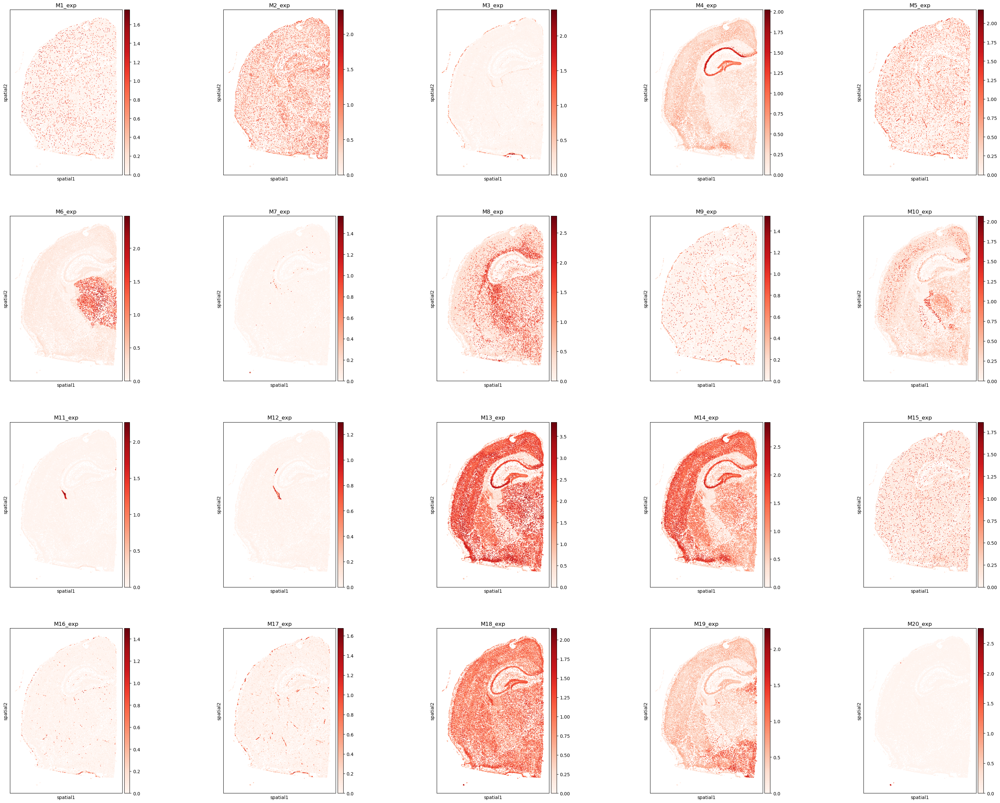

In [19]:
# Visualize the spatial distribution of the top 20 program-expression scores.
plt.rcParams["figure.figsize"] = (7, 7)
program_list = ggm.modules_summary['module_id'] + '_exp'
sc.pl.spatial(adata, spot_size = 30, color = program_list[:20], cmap = 'Reds', ncols = 5)


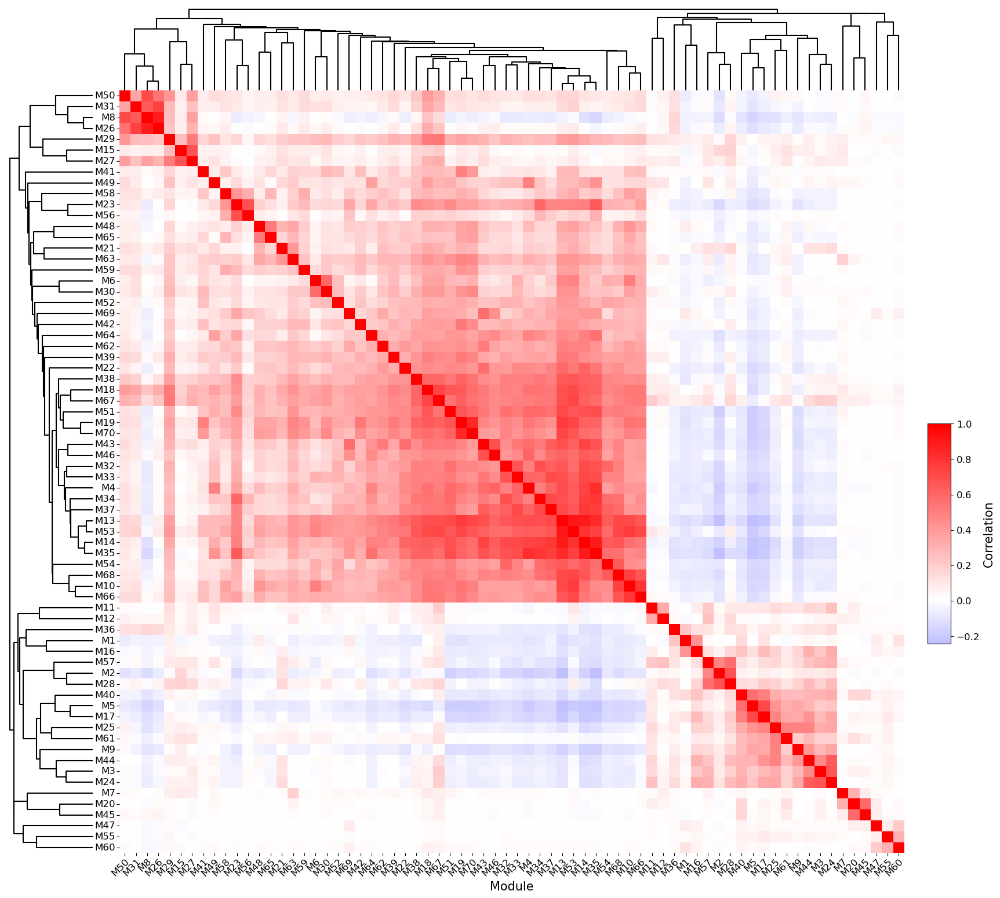

In [20]:
# Compute pairwise program similarity and plot the correlation heatmap with dendrograms.
sg.module_similarity_plot(adata, ggm_key = 'ggm', corr_method = 'pearson', heatmap_metric = 'correlation', 
                          fig_height = 19, fig_width = 20, dendrogram_height = 0.1, dendrogram_space = 0.06, return_summary = False)


In [21]:
# Assign spot-level annotations via Gaussian Mixture Models (GMMs) based on program expression.
sg.calculate_gmm_annotations(adata, ggm_key = 'ggm')


M1 processed successfully, annotated cells: 4359
M2 processed successfully, annotated cells: 9347
M3 processed successfully, annotated cells: 2512
M4 processed successfully, annotated cells: 20517
M5 processed successfully, annotated cells: 9304
M6 processed successfully, annotated cells: 3587
M7 processed successfully, annotated cells: 346
M8 processed successfully, annotated cells: 8198
M9 processed successfully, annotated cells: 4330
M10 processed successfully, annotated cells: 2501
M11 processed successfully, annotated cells: 794
M12 processed successfully, annotated cells: 465
M13 processed successfully, annotated cells: 26976
M14 processed successfully, annotated cells: 23015
M15 processed successfully, annotated cells: 2192
M16 processed successfully, annotated cells: 2498
M17 processed successfully, annotated cells: 4120
M18 processed successfully, annotated cells: 1336
M19 processed successfully, annotated cells: 18649
M20 processed successfully, annotated cells: 53
M21 proces

In [22]:
# Optionally smooth the annotations using spatial k-NN (on the 'spatial' embedding).
sg.smooth_annotations(adata, ggm_key = 'ggm', embedding_key = 'spatial', k_neighbors = 24)


M1 processed. remain cells: 3752
M2 processed. remain cells: 9435
M3 processed. remain cells: 2893
M4 processed. remain cells: 26876
M5 processed. remain cells: 9905
M6 processed. remain cells: 5146
M7 processed. remain cells: 270
M8 processed. remain cells: 9144
M9 processed. remain cells: 4475
M10 processed. remain cells: 2142
M11 processed. remain cells: 815
M12 processed. remain cells: 612
M13 processed. remain cells: 39646
M14 processed. remain cells: 32708
M15 processed. remain cells: 1369
M16 processed. remain cells: 1796
M17 processed. remain cells: 3765
M18 processed. remain cells: 775
M19 processed. remain cells: 23926
M20 processed. remain cells: 45
M21 processed. remain cells: 896
M22 processed. remain cells: 694
M23 processed. remain cells: 3810
M24 processed. remain cells: 3126
M25 processed. remain cells: 2492
M26 processed. remain cells: 4528
M27 processed. remain cells: 1140
M28 processed. remain cells: 2430
M29 processed. remain cells: 171
M30 processed. remain cells:

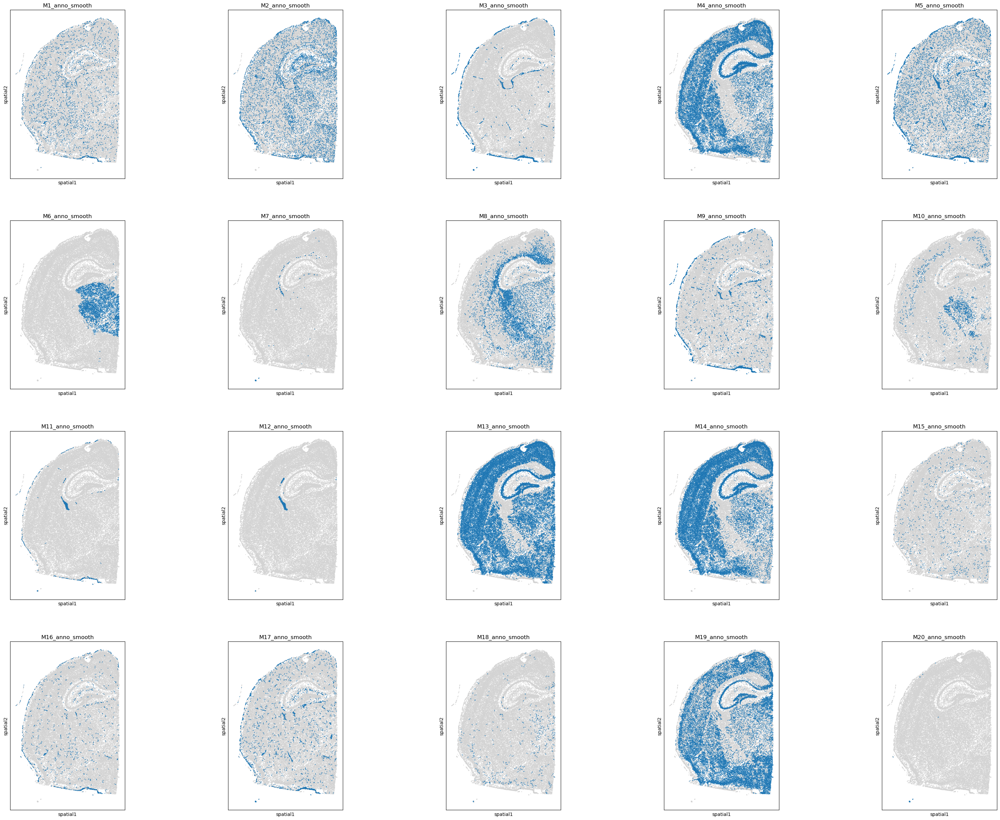

In [23]:
# Display smoothed annotations for top 20 programs.
# If smoothing is skipped, use 'M1_anno' … 'M20_anno' instead.
program_list = ggm.modules_summary['module_id'] + '_anno_smooth'
sc.pl.spatial(adata, spot_size = 30, color = program_list[:20], legend_loc = None, ncols = 5)
# Where the blue nodes indicate the spots annotated by the program, and gray nodes are unassigned.


In [24]:
# Integrate multiple program-derived annotations into a single label set via sg.integrate_annotations.
sg.integrate_annotations(adata, ggm_key = 'ggm', use_smooth = False, neighbor_similarity_ratio = 0.6, result_anno = 'ggm_annotation')
# Here we integrate all programs as an example. You can specify a subset of programs via the 'modules_used' parameter.



Calculating 24 nearest neighbors for each cell based on spatial embedding...


51059 of total 62207 cells have multiple annotations. Among them, 
    7317 cells are resolved by neighbors.
    43742 cells are resolved by expression score.

Integrated annotation stored in adata.obs['ggm_annotation'].



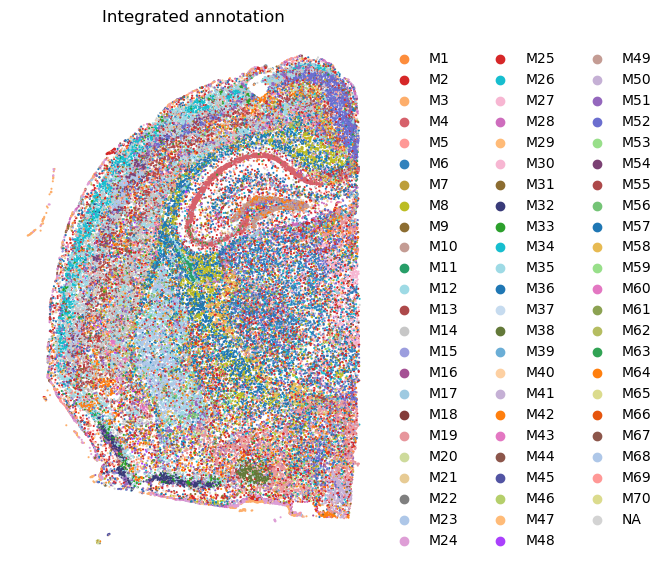

In [25]:
# Visualize the integrated annotation.
plt.rcParams["figure.figsize"] = (7, 7)
sc.pl.spatial(adata, spot_size = 30, color = ['ggm_annotation'], palette = adata.uns['module_colors'], frameon = False, title = 'Integrated annotation')



### Part 3: Cluster spots based a dimensionality reduction of program expression ###

In [26]:
# Build a neighborhood graph based on program expression and perform clustering.
sc.pp.neighbors(adata, 
                use_rep='module_expression_scaled',
                n_pcs=adata.obsm['module_expression_scaled'].shape[1])
sc.tl.leiden(adata, resolution=3, key_added='leiden_ggm')
sc.tl.louvain(adata, resolution=3, key_added='louvan_ggm')


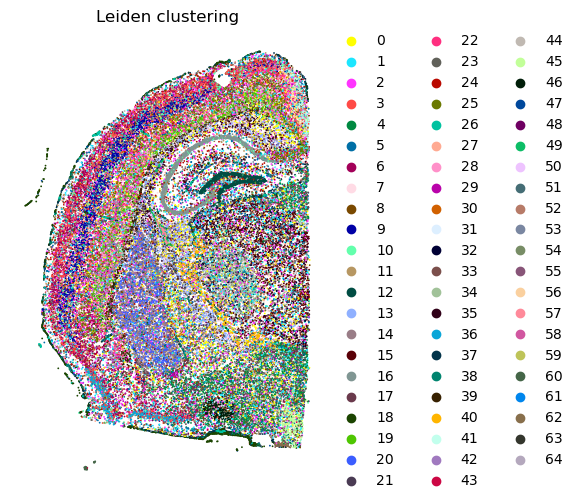

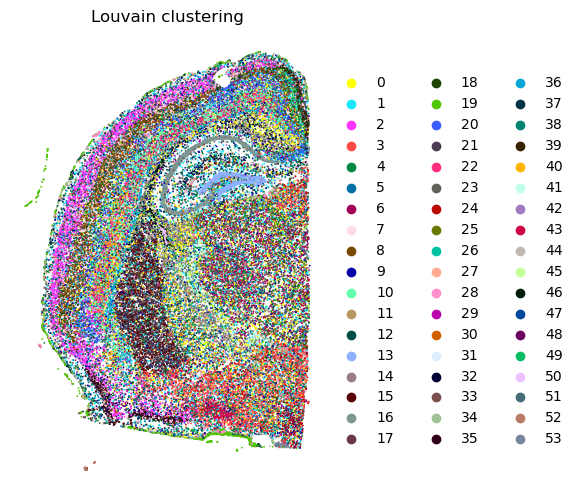

In [27]:
# Visualize the clustering results.
plt.rcParams["figure.figsize"] = (6, 6)
sc.pl.spatial(adata, spot_size = 30, color = ['leiden_ggm'], frameon = False, title = 'Leiden clustering')
plt.rcParams["figure.figsize"] = (6, 6)
sc.pl.spatial(adata, spot_size = 30, color = ['louvan_ggm'], frameon = False, title = 'Louvain clustering')


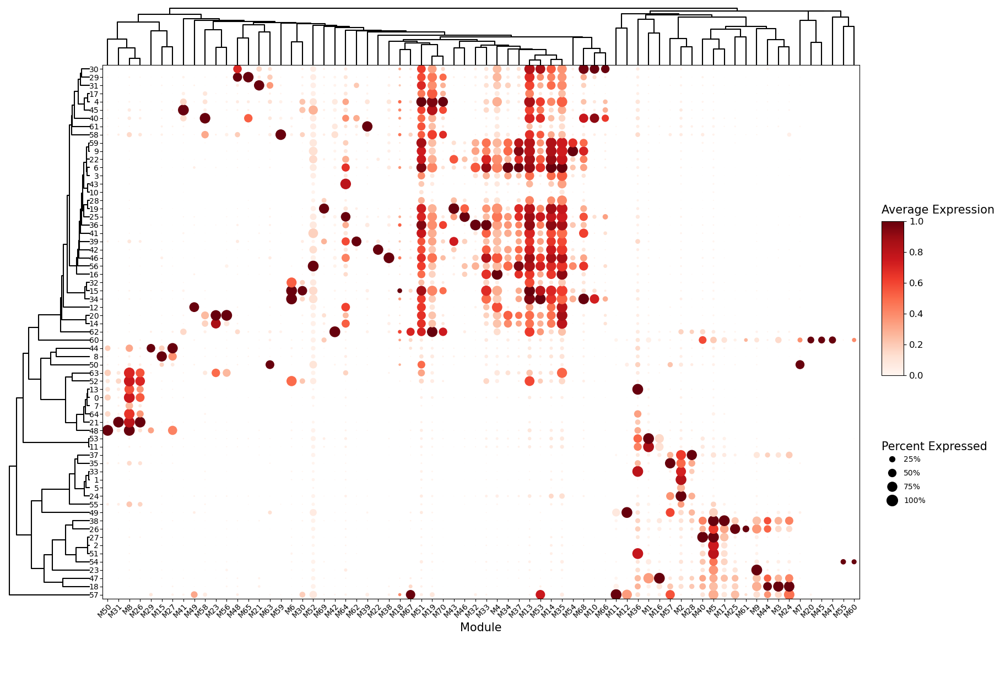

In [28]:
# Summarize program-expression across the leiden clusters clusters as a dot plot.
sg.module_dot_plot(adata, ggm_key = 'ggm', groupby = 'leiden_ggm', scale=True,
                   dendrogram_height = 0.1, dendrogram_space = 0.03, fig_height=14, fig_width = 20, axis_fontsize = 10)


In [29]:
# Save the annotated AnnData object.
adata.write("data/Mouse_Brain_5K_ggm_anno.h5ad")
